**Vehicle Detection Project**

The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector. 
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.

# Step 1 Make a list of images to read in

In [144]:
import os
import glob
# images are divided up into vehicles and non-vehicles folders (each of which contains sub-folders)
# First locate vehicle images
basedir = 'vehicles/'
# Different folders represent different sources for images e.g. GTI, Kitti
image_types = os.listdir(basedir)
cars = []
for imtype in image_types:
    cars.extend(glob.glob(basedir+imtype+'/*'))
    
print('Number of Vehicle images found: ', len(cars))
with open("cars.txt", 'w') as f:
    for fn in cars:
        f.write(fn+'\n')
        
# Do the same thing for non-vehicle images
basedir = 'non-vehicles/'
# Different folders represent different sources for images e.g. GTI, Kitti
image_types = os.listdir(basedir)
notcars = []
for imtype in image_types:
    notcars.extend(glob.glob(basedir+imtype+'/*'))
    
print('Number of Vehicle images found: ', len(notcars))
with open("notcars.txt", 'w') as f:
    for fn in notcars:
        f.write(fn+'\n')

Number of Vehicle images found:  8792
Number of Vehicle images found:  8968


In [60]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import time
from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
# Note the last import is only valid for scikit-learn version >= 0.18
# for scikit-learn <= 0.18 use:
# from sklearn.cross_validate import train_test_split

## Define the feature extraction functions

In [17]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        return features

# Define a function to spacial binning on the image (downsampling the image)
# Training data is 64x64 images and this function downsamples the all the color channels of the image ...
def bin_spatial(img, size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    # ... and combines the color channels again.
    return np.hstack((color1, color2, color3))
                        
# Define a function to compute color histogram features 
# NEED TO CHANGE bins_range if reading .png files with mpimg!
# I opted to get rid of bin range altogheter and let it be automatic
# Just define how many bins and do not care about image format .jpg or .png 
def color_hist(img, nbins=32):    #bins_range=(0, 256)
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features


## Put the feature extractions functions together

In [18]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        # Extract the features set to true for each of the filename images
        # Notice the order in which the features were appended to the final feature vector
        # When classifying images the order must be the same. Otherwise the classifier won't work.
        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

In [19]:
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

In [20]:
# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

In [26]:
# Define a function to extract features from a single image window
# This function is very similar to extract_features()
# just for a single image rather than list of images
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True, vis=False):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            if vis == True:
                hog_features, hog_image = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=True, feature_vec=True)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    if vis == True:
        return np.concatenate(img_features), hog_image
    else:
        return np.concatenate(img_features)

In [45]:
# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
# clf is a trained classifier and scaler is the tool used to normalize the data (Scaler applied on extracted features)
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image and resize it to 64x64
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

In [46]:
# Define a function for plotting
def visualize(fig, rows, cols, imgs, titles):
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i+1)
        plt.title(i+1)
        img_dims = len(img.shape)
        if img_dims < 3:
            plt.imshow(img, cmap='hot')
            plt.title(titles[i])
        else:
            plt.imshow(img)
            plt.title(titles[i])

In [29]:
%matplotlib inline

# Choose random car / not-car images
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))

# Read in car / not-car images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])

In [47]:
# Define feature parameters
color_space = 'LUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 0 # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

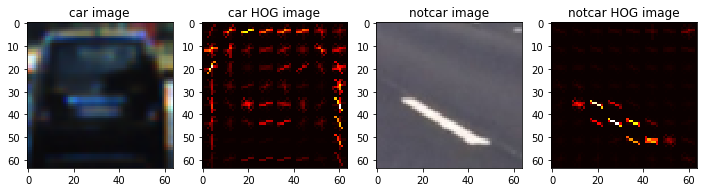

In [48]:
car_features, car_hog_image = single_img_features(car_image, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat, vis=True)

notcar_features, notcar_hog_image = single_img_features(notcar_image, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat, vis=True)

images = [car_image, car_hog_image, notcar_image, notcar_hog_image]
titles = ['car image', 'car HOG image', 'notcar image', 'notcar HOG image']
fig = plt.figure(figsize=(12,3))
visualize(fig, 1, 4, images, titles)

## Train a classifier

In [55]:
# Define feature parameters
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations 9 are suggested by the original paper
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL" using all color channels to get more features 
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

In [56]:
t = time.time()
n_samples = 1000
random_idxs = np.random.randint(0, len(cars), n_samples)
test_cars = cars#np.array(cars)[random_idxs]
test_notcars = notcars#np.array(notcars)[random_idxs]


car_features = extract_features(test_cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

notcar_features = extract_features(test_notcars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

print(time.time() - t, 'Seconds to compute features...')

X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block',
     hist_bins, 'histogram bins, and', spatial_size, 'spatial sampling')

print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

76.34387183189392 Seconds to compute features...
Using: 9 orientations 8 pixels per cell and 2 cells per block 32 histogram bins, and (32, 32) spatial sampling
Feature vector length: 8460
8.87 Seconds to train SVC...
Test Accuracy of SVC =  0.9904


0.0 1.0
0.5004470348358154 seconds to process one image searching 100 windows
0.0 1.0
0.4580569267272949 seconds to process one image searching 100 windows
0.0 1.0
0.44371700286865234 seconds to process one image searching 100 windows
0.0 1.0
0.5101370811462402 seconds to process one image searching 100 windows
0.0 1.0
0.4464881420135498 seconds to process one image searching 100 windows
0.0 1.0
0.44416093826293945 seconds to process one image searching 100 windows


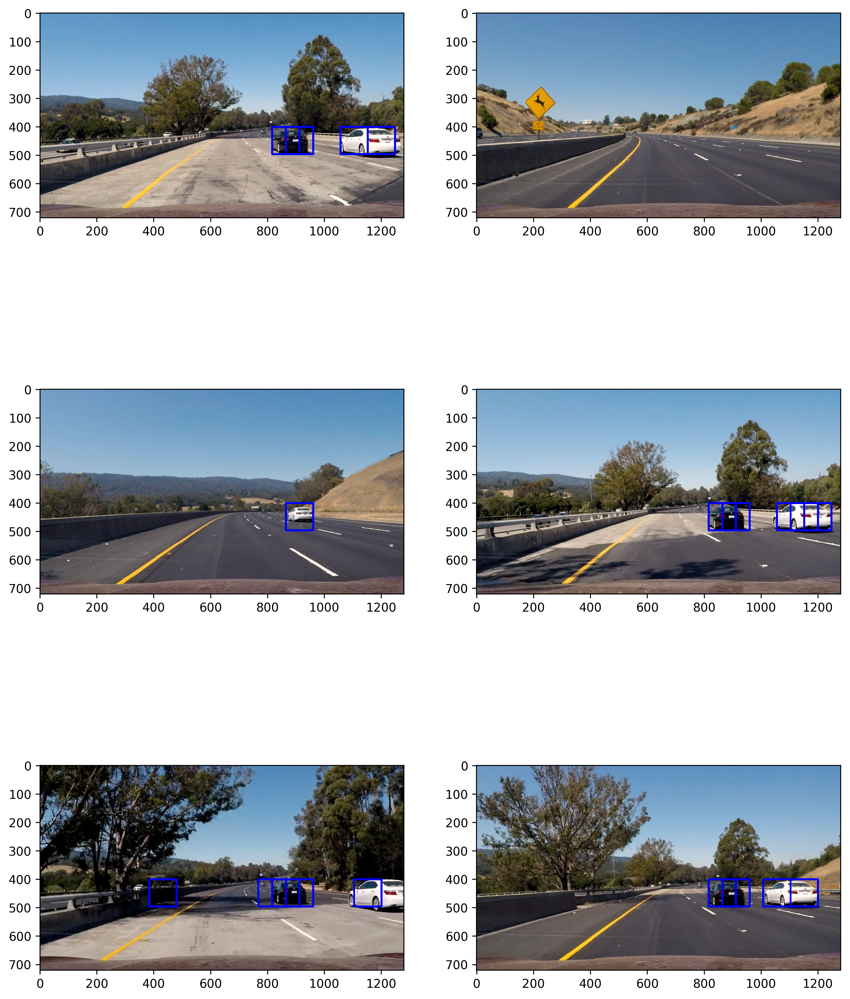

In [59]:
search_path = 'test_images/*'
example_images = glob.glob(search_path)
images = []
titles = []
y_start_stop = [400, 656] # Min and max in y to search in slide_window()
overlape = 0.5
# Step through each images in the example images
for img_src in example_images:
    t1 = time.time()
    img = mpimg.imread(img_src)
    # Make a copy of the image to draw on
    draw_img = np.copy(img)
    # Convert the jpgs because we trained on pngs
    img = img.astype(np.float32)/255
    print(np.min(img), np.max(img))
    
    # Get a list of windows
    windows = slide_window(img, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                    xy_window=(96, 96), xy_overlap=(overlape, overlape))
    
    hot_windows = search_windows(img, windows, svc, X_scaler, color_space=color_space,
                                 spatial_size=spatial_size, hist_bins=hist_bins, 
                                 orient=orient, pix_per_cell=pix_per_cell, 
                                 cell_per_block=cell_per_block, 
                                 hog_channel=hog_channel, spatial_feat=spatial_feat, 
                                 hist_feat=hist_feat, hog_feat=hog_feat)

    window_img = draw_boxes(draw_img, hot_windows, color=(0, 0, 255), thick=6)
    images.append(window_img)
    titles.append('')
    print(time.time()-t1, 'seconds to process one image searching', len(windows), 'windows')
    
fig = plt.figure(figsize=(12,28), dpi=300)
visualize(fig, 5, 2, images, titles)

Take the HOG features for the entire image once and then subsample that array to extract features for each window to speed up the process.

In [11]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB22YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

0.32562804222106934 seconds to run, total windows =  294
0.327146053314209 seconds to run, total windows =  294
0.3399620056152344 seconds to run, total windows =  294
0.32669806480407715 seconds to run, total windows =  294
0.3071019649505615 seconds to run, total windows =  294
0.3236508369445801 seconds to run, total windows =  294


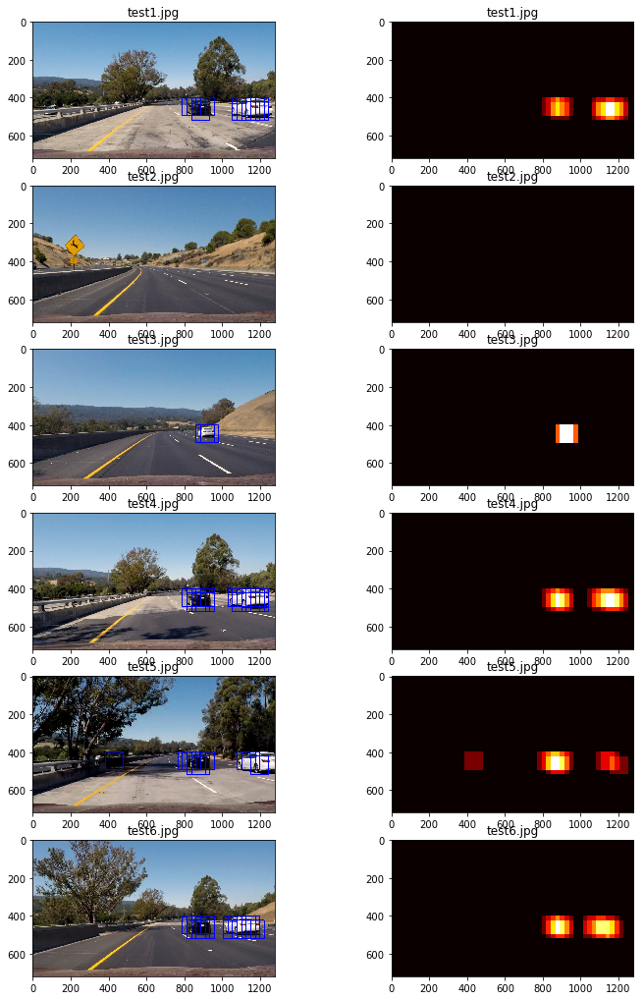

In [91]:
import pdb
out_images = []
out_maps = []
out_titles = []
out_boxes = []

# Consider a narrower swath in y
ystart = 400
ystop = 656
# Scale the entire image instead of the single windows
scale = 1.5
# Iterate over test images
for img_src in example_images:
    img_boxes = []
    t = time.time()
    count = 0
    img = mpimg.imread(img_src)
    # Make a copy of the image to draw on
    draw_img = np.copy(img)
    # Make a heatmap of zeros: with each positive detection we want to add heat (one) to this heatmap
    # Used to extract overlapping bounding boxes
    heatmap = np.zeros_like(img[:,:,0])
    # Convert the jpgs because we trained on pngs
    img = img.astype(np.float32)/255
    
    # Create a cropped version of the image
    img_tosearch = img[ystart:ystop,:,:]
    # Convert the color of the image
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    # Change the scale of the image if scale parameter is not equal to one
    # Instead of different window sizes, the whole image is resized
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))

    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    # Define blocks and steps as above
    # Hold the number of HOG cells (blocks) across the image (cells correspond to 8 pixels)
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    nfeat_per_block = orient*cell_per_block**2
    # Window size
    window = 64
    # Number of windows 
    nblocks_per_window = (window // pix_per_cell) - 1
    cells_per_step = 2 # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image (False yields a multi dimensional array)
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    # Step through nx and ny positions
    for xb in range(nxsteps):
        for yb in range(nysteps):
            count += 1
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            
            # Extract HOG for this patch and use ravel to unroll the feature vectors
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            # Stack the single feature vectors into one long feature vector
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            # Define where we are currently in pixel sapce of the image
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            # Extract the image patch to extract spatial and histogram features
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
            
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            # Stack features in the same order as done during training
            X = np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1)                  
            # Scale features and make a prediction
            test_features = X_scaler.transform(X)
            test_prediction = svc.predict(test_features)
            
            # If the prediction is positive
            if test_prediction == 1:
                # Draw a box (corresponding to scale)
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                #pdb.set_trace()
                cv2.rectangle(draw_img, (xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart), (0,0,255),3)
                # Store the boxes
                img_boxes.append(((xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart)))
                # Add heat to the heatmap
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] += 1
                
    print(time.time()-t, 'seconds to run, total windows = ',  count)
    
    
    out_images.append(draw_img)
    
    out_titles.append(img_src[-9:])
    out_titles.append(img_src[-9:])
    
    out_images.append(heatmap)
    out_maps.append(heatmap)
    out_boxes.append(img_boxes)
    
fig = plt.figure(figsize=(12,24))
visualize(fig, 8, 2, out_images, out_titles)

In [178]:
# Iterate over test images
def find_cars(img, scale):
    # Make a copy of the image to draw on
    draw_img = np.copy(img)
    # Make a heatmap of zeros: with each positive detection we want to add heat (one) to this heatmap
    # Used to extract overlapping bounding boxes
    heatmap = np.zeros_like(img[:,:,0])
    # Convert the jpgs because we trained on pngs
    img = img.astype(np.float32)/255
    
    # Create a cropped version of the image
    img_tosearch = img[ystart:ystop,:,:]
    # Convert the color of the image
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    # Change the scale of the image if scale parameter is not equal to one
    # Instead of different window sizes, the whole image is resized
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        #ctrans_tosearch_scaled = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    #ch1_scaled = ctrans_tosearch_scaled[:,:,0]
    #ch2_scaled = ctrans_tosearch_scaled[:,:,0]
    #ch3_scaled = ctrans_tosearch_scaled[:,:,0]
    
    # Define blocks and steps as above
    # Hold the number of HOG cells (blocks) across the image (cells correspond to 8 pixels)
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    nfeat_per_block = orient*cell_per_block**2
    # Window size
    window = 64
    # Number of windows 
    nblocks_per_window = (window // pix_per_cell) - 1
    cells_per_step = 1 # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image (False yields a multi dimensional array)
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    #hog1_scaled = get_hog_features(ch1_scaled, orient, pix_per_cell, cell_per_block, feature_vec=False)
    #hog2_scaled = get_hog_features(ch2_scaled, orient, pix_per_cell, cell_per_block, feature_vec=False)
    #hog3_scaled = get_hog_features(ch3_scaled, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    # Step through nx and ny positions
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            
            # Extract HOG for this patch and use ravel to unroll the feature vectors
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            #hog_feat1_scaled = hog1_scaled[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            #hog_feat2_scaled = hog2_scaled[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            #hog_feat3_scaled = hog3_scaled[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            # Stack the single feature vectors into one long feature vector
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            #hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3, hog_feat1_scaled, hog_feat2_scaled, hog_feat3_scaled))
            
            # Define where we are currently in pixel space of the image
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            # Extract the image patch to extract spatial and histogram features
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
            #subimg_scaled = cv2.resize(ctrans_tosearch_scaled[ytop:ytop+window, xleft:xleft+window], (64,64))
            
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            #spatial_features_scaled = bin_spatial(subimg_scaled, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            #hist_features_scaled = color_hist(subimg_scaled, nbins=hist_bins)
            
            # Stack features in the same order as done during training
            X = np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1)
            #X = np.hstack((spatial_features, spatial_features_scaled, hist_features, hist_features_scaled,
            #               hog_features)).reshape(1, -1)  
            # Scale features and make a prediction
            test_features = X_scaler.transform(X)
            test_prediction = svc.predict(test_features)
            
            # If the prediction is positive
            if test_prediction == 1:
                # Draw a box (corresponding to scale)
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                #pdb.set_trace()
                cv2.rectangle(draw_img, (xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart), (0,0,255),3)
                # Store the boxes
                img_boxes.append(((xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart)))
                # Add heat to the heatmap
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] += 1
                
    return draw_img, heatmap

In [179]:
from scipy.ndimage.measurements import label

def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return threshold map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

2
0
1
2
2
2


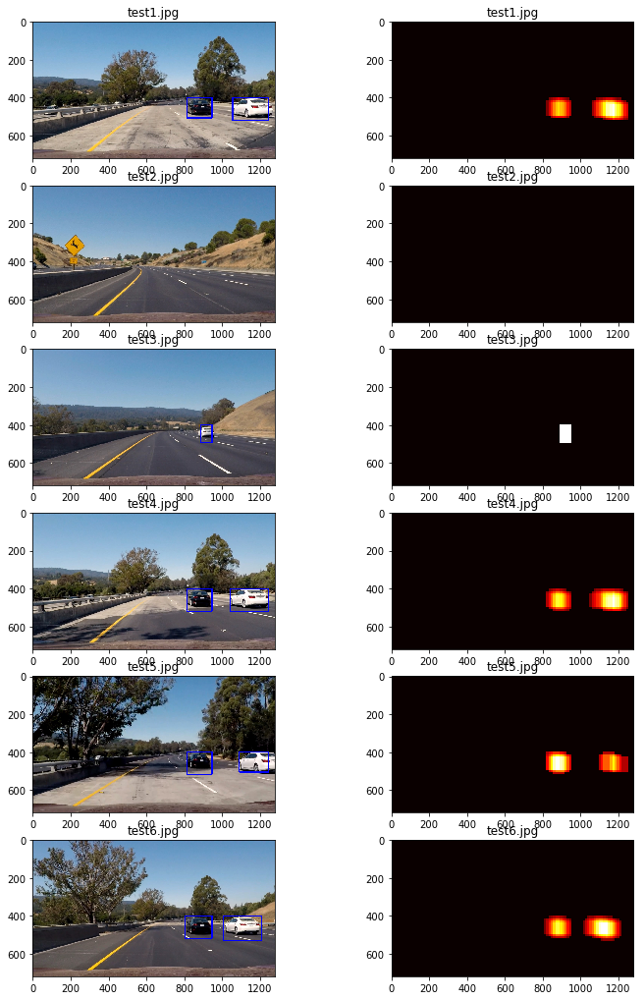

In [181]:
out_images = []
out_maps = []
# Consider a narrower swath in y
ystart = 400
ystop = 656
# Scale the entire image instead of the single windows
scale = 1.5
scale2 = 1
threshold = 3
# Iterate over test images
for img_src in example_images:
    img = mpimg.imread(img_src)
    out_img, heat_map = find_cars(img, scale)
    #print(np.max(heat_map))
    heat_map = apply_threshold(heat_map, threshold)
    # Label the heatmap
    labels = label(heat_map)
    print(labels[1])
    # Make a copy of the image to draw on
    draw_img = np.copy(img)
    # Draw bounding box on a copy of the image
    draw_img = draw_labeled_bboxes(draw_img, labels)
    out_images.append(draw_img)
    out_images.append(heat_map)
    
fig = plt.figure(figsize=(12,24))
visualize(fig, 8, 2, out_images, out_titles)

In [182]:
def process_image(img):
    out_img, heat_map = find_cars(img, scale)
    out_img, heat_map2 = find_cars(img, scale2)
    heat_map = heat_map + heat_map2
    # Apply a threshold to the heatmap to avoid false positives
    heat_map = apply_threshold(heat_map, threshold)
    labels = label(heat_map)
    #print(len(labels[1]))
    # Draw a bounding box on a copy of the image
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img

In [149]:
# Import everything to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

clip = VideoFileClip("project_video.mp4")
#clip = VideoFileClip("test_video.mp4")
test_clip = clip.fl_image(process_image)
project_output = 'result_video.mp4'
test_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video result_video.mp4
[MoviePy] Writing video result_video.mp4


100%|█████████▉| 1260/1261 [1:17:47<00:03,  3.53s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: result_video.mp4 



In [150]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

In [160]:
# Define a class to receive the characteristics of each vehicle detection
# Objects defined as "Vehicles" will be where multiple overlapping detections exist in the heatmap
class Vehicle():
    def __init__(self):
        self.detected = False # was the vehicle detected in the last iteration
        self.n_detections = 0 # number of times this car has been detected
        self.n_notdtections = 0  # number of consecutive times this car has not been detected
        self.xpixels = None # Pixel x values of last detection
        self.ypixels = None # Pixel y values of last detection
        self.recent_xfitted = [] # x position of the last n fits of the bounding box 
        self.bestx = None # average x position of the last n fits
        self.recent_yfitted = [] # y position of the last n fits of the bounding box 
        self.besty = None # average y position of the last n fits
        self.recent_wfitted = [] # Width of the last n fits of the bounding box
        self.bestw = None # average width of the n fits
        self.recent_hfitted = [] # height of the last n fits of the bounding box
        self.besth = None # average height of the last n fits
        

In [161]:
#carslist = []
#carslist.append(Vehicle())

In [183]:
# Maximum number of last detections of a vehicle
n = 5
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        
        
        if not carslist[car_number]:
            newVehicle = Vehicle()
            newVehicle.detected = True
            newVehicle.n_detections += 1 # number of times this car has been detected
            newVehicle.n_notdtections = 0  # number of consecutive times this car has not been detected
            newVehicle.xpixels = nonzerox # Pixel x values of last detection
            newVehicle.ypixels = nonzeroy # Pixel y values of last detection
            newVehicle.recent_xfitted.append(np.min(nonzerox)) # x position of the last n fits of the bounding box 
            newVehicle.bestx = np.mean(recent_xfitted) # average x position of the last n fits
            newVehicle.recent_yfitted.append(np.min(nonzeroy)) # y position of the last n fits of the bounding box 
            newVehicle.besty = np.mean(recent_yfitted) # average y position of the last n fits
            newVehicle.recent_wfitted.append(np.max(nonzerox)) # Width of the last n fits of the bounding box
            newVehicle.bestw = np.mean(recent_wfitted) # average width of the n fits
            newVehicle.recent_hfitted.append(np.max(nonzeroy)) # height of the last n fits of the bounding box
            newVehicle.besth = np.mean(recent_hfitted) # average height of the last n fits
            carslist.append(newVehicle)
        else:
            carslist[car_number].detected = True
            carslist[car_number].n_detections += 1 # number of times this car has been detected
            carslist[car_number].n_notdtections = 0  # number of consecutive times this car has not been detected
            carslist[car_number].xpixels = nonzerox # Pixel x values of last detection
            carslist[car_number].ypixels = nonzeroy # Pixel y values of last detection
            carslist[car_number].recent_xfitted.append(np.min(nonzerox)) # x position of the last n fits of the bounding box 
            carslist[car_number].bestx = np.mean(recent_xfitted) # average x position of the last n fits
            carslist[car_number].recent_yfitted.append(np.min(nonzeroy)) # y position of the last n fits of the bounding box 
            carslist[car_number].besty = np.mean(recent_yfitted) # average y position of the last n fits
            carslist[car_number].recent_wfitted.append(np.max(nonzerox)) # Width of the last n fits of the bounding box
            carslist[car_number].bestw = np.mean(recent_wfitted) # average width of the n fits
            carslist[car_number].recent_hfitted.append(np.max(nonzeroy)) # height of the last n fits of the bounding box
            carslist[car_number].besth = np.mean(recent_hfitted) # average height of the last n fits
            if n_detections > n:
                carslist[car_number].recent_xfitted[2:]
                carslist[car_number].recent_yfitted[2:]
                carslist[car_number].recent_wfitted[2:]
                carslist[car_number].recent_hfitted[2:]
                
            
        # Draw the averaged box on the image
        bbox = ((carslist[car_number].bestx, carslist[car_number].besty, carslist[car_number].bestw, carslist[car_number].besth))
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
            
    # Return the image
    return img

In [184]:
carslist = []
def process_image(img):
    out_img, heat_map = find_cars(img, scale)
    # Apply a threshold to the heatmap to avoid false positives
    heat_map = apply_threshold(heat_map, threshold)
    labels = label(heat_map)
    #print(len(labels[1]))
    # Draw a bounding box on a copy of the image
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img

In [186]:
# Import everything to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

clip = VideoFileClip("project_video.mp4")
test_clip = clip.fl_image(process_image)
project_output = 'result_video2.mp4'
test_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video result_video2.mp4
[MoviePy] Writing video result_video2.mp4



  0%|          | 0/1261 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))